# Reconociendo el Canto de las Aves: CNN y Algoritmos Genéticos en la Extracción de Características de Espectrogramas


### Resumen

### Metodologia

#### Descripción de población y muestra

Para el desarrollo del presente proyecto, se eligió un conjunto de datos que contiene imágenes de espectrogramas previamente procesados, disponibles en el sitio web Kaggle {cite}`kaggle_data`. Los audios utilizados para generar los espectrogramas, fueron obtenidos del sitio web **Xeno-Canto**, en el cual se encuentran registros de sonidos de toda clase de fauna alrededor del mundo. Los audios con los cantos de las aves fueron convertidos en espectrogramas utilizando una transformada de Fourier de tamaño 2048 y luego se les aplicó una transformación logarítmica.

Los espectrogramas consisten en una representación visual que muestra cómo se distribuyen las frecuencias en una señal de sonido. Esta representación gráfica puede revelar detalles específicos, como frecuencias elevadas o cambios en la amplitud, que podrían no ser perceptibles incluso si se encuentran dentro del rango auditivo humano {cite}`espectguill`. 

La muestra inicial de datos para este proyecto son espectrogramas de 152 especies de aves de la población total de especies de aves presentes en Hawaii, y no se tiene información temporal con respecto al momento en que se registraron los audios.

Durante la realización del análisis exploratorio, y por limitaciones para aplicar técnicas de balanceo de datos, se seleccionan como muestra las 6 especies con mayor cantidad de datos.

```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/Proyecto/img_esp.png
---
height: 150px
name: directive-fig
---
Especie Loxops caeruleirostris (Akeke) junto a su espectograma
```





#### Diccionario de variables

Los datos utilizados en el proyecto son imágenes de espectrogramas de 152 especies de aves presentes en Hawái. Como se verá más adelante, la cantidad de espectrogramas para cada especie no es igual, por lo que estamos ante un conjunto de datos desbalanceado.

* **Variable dependiente**: Etiquetas con la abreviatura del nombre común de las aves.
* **Variables explicativas**: Vector de características extraídas de imágenes de espectrogramas del espectro de frecuencias de la emisión sonora del canto de las aves.

Los espectogramas, se utilizaron para extraer patrones visuales y características importantes presentes en las imágenes, que permitan identificar las especies de aves. Estas caracteristicas son extraidas al momento de implementar los modelos, y no se tienen de antemano.

Algunas de las caracteristicas extraíadas de los espectrogramas por los modelos son:

* **Estadísticas de color**: Los estadísticos de distribución de color son comunes en la recuperación de imágenes, ya que describen la variación de la intensidad del color en una imagen. En el caso de los espectrogramas de sonido, estos estadísticos se aplican a cada imagen monocroma, permitiendo describir cómo varía la intensidad del sonido en regiones definidas en términos de tiempo y frecuencia. {cite}`color1`
* **Direccionalidad**: La direccionalidad de la imagen es una característica importante para describir la textura de una imagen. Describe la dirección en la que se concentra o dispersa la textura de la imagen. {cite}`direc2`






#### Técnicas

Para el desarrollo de este modelo se implementaron los siguientes algoritmos de aprendizaje automatico:
* Convolutional Neural Network (CNN)
* Transferencia de conocimiento con MobileNetV2
* Convolutional Neural Network con Algoritmo Genetico (GA)

#### Diseño general

El tipo de diseño de investigación utilizado en este trabajo es Mineria de datos. Las etapas consideradas durante el desarrollo del trabajo fueron: 
* Extracción de datos
* Procesamiento de datos
* Análisis exploratorio de los datos
* Modelado
* Evaluación de resultados

#### Validez

### Resultados y Discusiones

#### Exploración de los datos

Para la exploración de los datos, se utilizaron los audios originales con los cuales se generaron los espectogrmas, ya que estos nos podrian ayudar a entender las diferencias entre los cantos de las aves, y como esto puede ayudar a identificarlas. 


In [1]:
import os
import pandas as pd
import torch
import torchaudio
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import librosa
import librosa.display
import IPython.display as ipd
import sklearn
import warnings
import seaborn as sns
warnings.filterwarnings('ignore')

ModuleNotFoundError: No module named 'pandas'

In [3]:
#Metadata de los audios
train_csv=pd.read_csv('C:/Users/kaes1/Desktop/MachineLearningUN/Proyecto/train_metadata.csv')
train_csv.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,time,url,filename
0,afrsil1,[],"['call', 'flight call']",12.3910,-1.4930,Euodice cantans,African Silverbill,Bram Piot,Creative Commons Attribution-NonCommercial-Sha...,2.5,08:00,https://www.xeno-canto.org/125458,afrsil1/XC125458.ogg
1,afrsil1,"['houspa', 'redava', 'zebdov']",['call'],19.8801,-155.7254,Euodice cantans,African Silverbill,Dan Lane,Creative Commons Attribution-NonCommercial-Sha...,3.5,08:30,https://www.xeno-canto.org/175522,afrsil1/XC175522.ogg
2,afrsil1,[],"['call', 'song']",16.2901,-16.0321,Euodice cantans,African Silverbill,Bram Piot,Creative Commons Attribution-NonCommercial-Sha...,4.0,11:30,https://www.xeno-canto.org/177993,afrsil1/XC177993.ogg
3,afrsil1,[],"['alarm call', 'call']",17.0922,54.2958,Euodice cantans,African Silverbill,Oscar Campbell,Creative Commons Attribution-NonCommercial-Sha...,4.0,11:00,https://www.xeno-canto.org/205893,afrsil1/XC205893.ogg
4,afrsil1,[],['flight call'],21.4581,-157.7252,Euodice cantans,African Silverbill,Ross Gallardy,Creative Commons Attribution-NonCommercial-Sha...,3.0,16:30,https://www.xeno-canto.org/207431,afrsil1/XC207431.ogg


La información de la metadata del conjunto de datos, tiene información sobre el tipo de canto de la especie (llamado, canción, alerta), las coordenadas en las cuales se realizó la grabación del audio, quien fue el autor de la grabación, la duración de la grabación, entre otros datos. Esta información no será utilizada en el modelo, pero permite conocer un poco más sobre el contexto de los audios.

In [4]:
# Muestra de audios
base_dir = 'C:/Users/kaes1/Desktop/MachineLearningUN/Audios/train_audio'
train_csv['full_path'] = base_dir+ '/' + train_csv['filename']
# train_csv['full_path'] = base_dir+ '/' + train_csv['primary_label'] + '/' + train_csv['filename']
brnowl = train_csv[train_csv['primary_label'] == "brnowl"].sample(1, random_state = 33)['full_path'].values[0]
comsan = train_csv[train_csv['primary_label'] == 'comsan'].sample(1, random_state = 33)['full_path'].values[0]
houspa = train_csv[train_csv['primary_label'] == "houspa"].sample(1, random_state = 33)['full_path'].values[0]
mallar3 = train_csv[train_csv['primary_label'] == 'mallar3'].sample(1, random_state = 33)['full_path'].values[0]
norcar = train_csv[train_csv['primary_label'] == 'norcar'].sample(1, random_state = 33)['full_path'].values[0]
skylar = train_csv[train_csv['primary_label'] == 'skylar'].sample(1, random_state = 33)['full_path'].values[0]
birds= ["brnowl", "comsan", "houspa", "mallar3", "norcar",'skylar']

* **Muestra de audios**

Para entender porque los cantos de las aves pueden ayudar en la identificación de especies, se muestran a continuación algunos ejemplos de audio obtenidos desde el repositorio de Xeno-canto.

```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/Proyecto/skylar.jpg
---
height: 150px
name: directive-fig
---
Especie Alauda arvensis (skylar)
```

In [26]:
ipd.Audio(skylar)

```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/Proyecto/houspa.jpg
---
height: 150px
name: directive-fig
---
Especie Passer domesticus (houspa)
```

In [11]:
ipd.Audio(houspa)

```{figure} C:/Users/kaes1/Desktop/MachineLearningUN/Proyecto/comsan.jpg
---
height: 150px
name: directive-fig
---
Especie Actitis hypoleucos (comsan)
```

In [25]:
ipd.Audio(comsan)

In [9]:
y_brnowl, sr_brnowl = librosa.load(brnowl)
audio_brnowl, _ = librosa.effects.trim(y_brnowl)

y_comsan, sr_comsan = librosa.load(comsan)
audio_comsan, _ = librosa.effects.trim(y_comsan)

y_houspa , sr_houspa  = librosa.load(houspa)
audio_houspa , _ = librosa.effects.trim(y_houspa)

y_mallar3, sr_mallar3 = librosa.load(mallar3)
audio_mallar3, _ = librosa.effects.trim(y_mallar3)

y_norcar, sr_norcar = librosa.load(norcar)
audio_norcar, _ = librosa.effects.trim(y_norcar)

y_skylar, sr_skylar = librosa.load(skylar)
audio_skylar, _ = librosa.effects.trim(y_skylar)

Para una muestra de 6 especies, se grafican las ondas sonoras extraídas de los audios. Aqui se observa que los audios tienen diferentes duraciones, desde segundos hasta minutos, y que la amplitud y frecuencia de las ondas es diferente de una especie a otra.

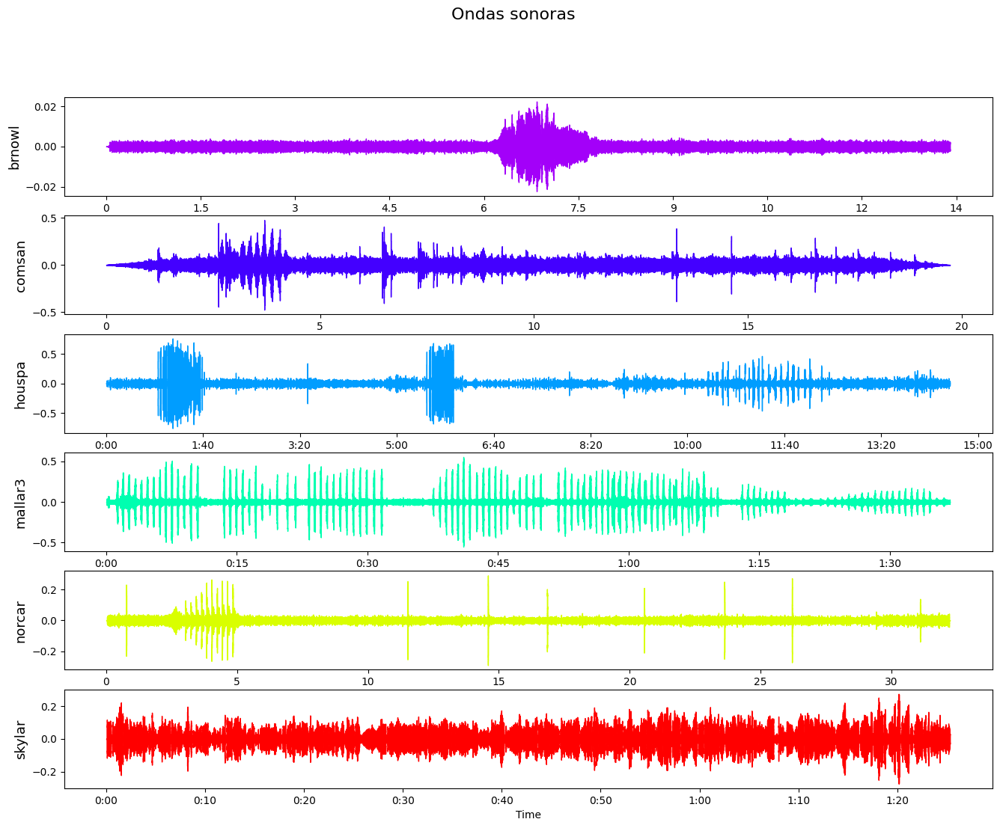

In [53]:
# graficas de señales de audio
fig, ax = plt.subplots(6, figsize = (16, 12))
fig.suptitle('Ondas sonoras', fontsize=16)
# birds= ["brnowl", "comsan", "houspa ", "mallar3", "norcar",'skylar']
librosa.display.waveshow(y = audio_brnowl, sr = sr_brnowl, color = "#A300F9", ax=ax[0])
librosa.display.waveshow(y = audio_comsan, sr = sr_comsan, color = "#4300FF", ax=ax[1])
librosa.display.waveshow(y = audio_houspa , sr = sr_houspa , color = "#009DFF", ax=ax[2])
librosa.display.waveshow(y = audio_mallar3, sr = sr_mallar3, color = "#00FFB0", ax=ax[3])
librosa.display.waveshow(y = audio_norcar, sr = sr_norcar, color = "#D9FF00", ax=ax[4])
librosa.display.waveshow(y = audio_skylar, sr = sr_skylar, color = "r", ax=ax[5]);

for i, name in zip(range(6), birds):
    ax[i].set_ylabel(name, fontsize=13)

* **Distribución de los datos**

Text(0, 0.5, 'Frequencia')

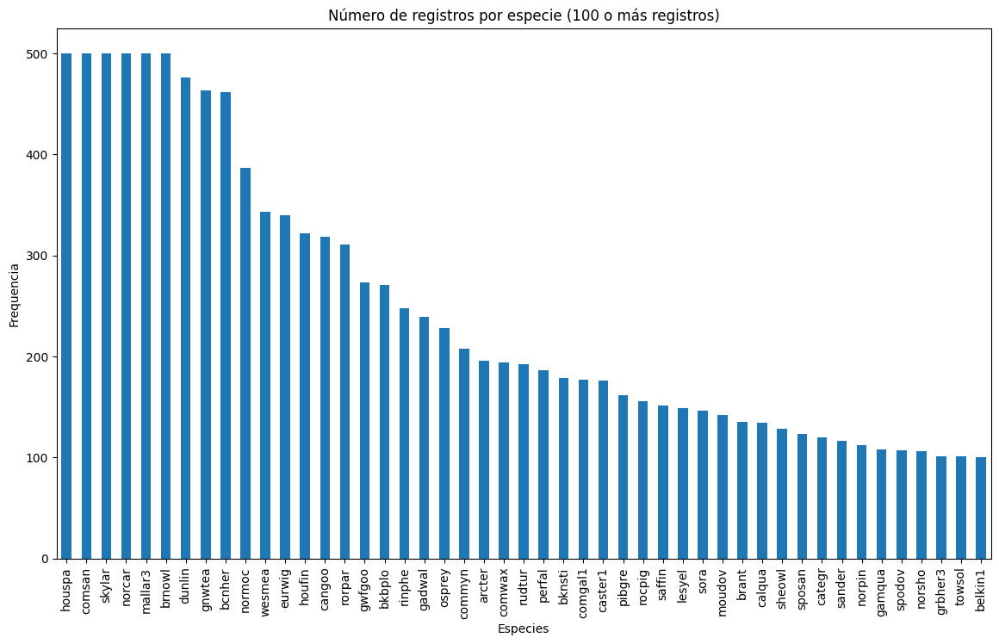

In [65]:
ax = train_csv.groupby('primary_label').filter(lambda x: len(x) >= 100 )['primary_label'].value_counts().plot(kind='bar',
                                    figsize=(14,8),
                                    title="Número de registros por especie (100 o más registros)")
ax.set_xlabel("Especies")
ax.set_ylabel("Frequencia")

En el gráfico de barras se visualizan aquellas especies con 100 o más muestras de espectogramas. Solo 47 de las 152 especies tienen 100 o mas espectrogramas en el conjunto de datos.

Text(0, 0.5, 'Frequencia')

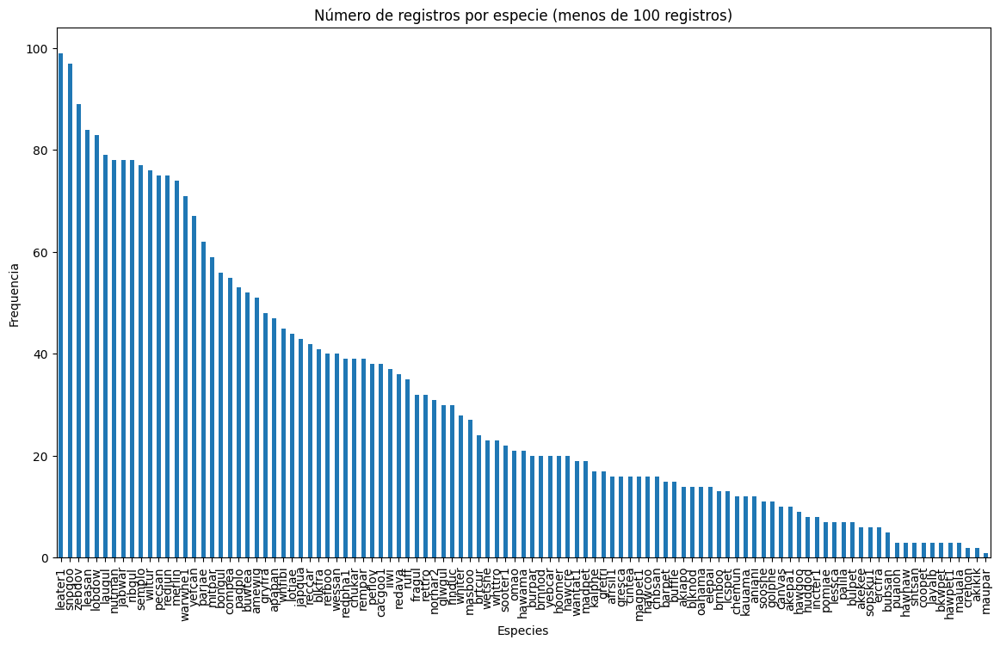

In [66]:
ax = train_csv.groupby('primary_label').filter(lambda x: len(x) < 100 )['primary_label'].value_counts().plot(kind='bar',
                                    figsize=(14,8),
                                    title="Número de registros por especie (menos de 100 registros)")
ax.set_xlabel("Especies")
ax.set_ylabel("Frequencia")

Se puede observar, que la gran mayoría de especies cuentan con menos de 100 espectrogramas en el conjuntos de datos, algunas incluso tienen menos de 10 especies, lo que indica que el conjunto de datos esta considerablemente desbalanceado.

En el siguiente gráfico se puede ver el rating o puntaje que tienen los audios en el sitio web de Xeno-canto. Este puntaje indica que tan buena es la grabación del canto de la ave (puntaje dado por la comunidad). La mayoría de los audios, tienen un puntaje igual o superior a 3, por lo que se puede considerar que la muestra de datos es representativa de los cantos de las especies, y por lo tanto, aptos para ser usados en el entrenamiento del modelo (por consiguiente, los espectrogramas generados deben ser aptos tambien).

Text(0, 0.5, 'Frequencia')

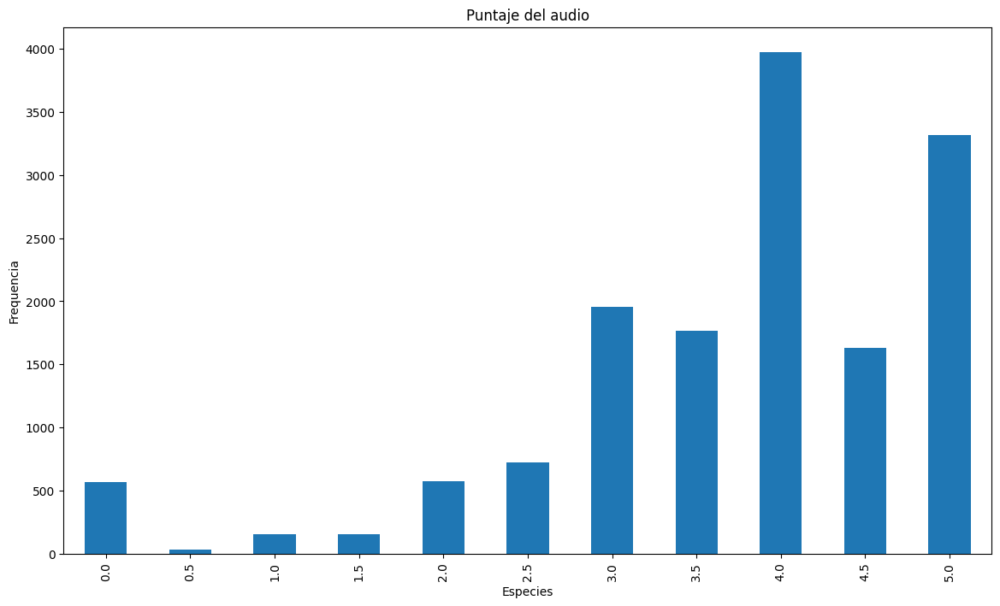

In [16]:
ax = train_csv.groupby('rating')['rating'].value_counts().plot(kind='bar',
                                    figsize=(14,8),
                                    title="Puntaje del audio")
ax.set_xlabel("Especies")
ax.set_ylabel("Frequencia")

* **Dimensión de las imágenes**

Debido a que las imágenes de los espectrogramas están a color, tienen 3 canales de color (red, green, blue). Las imágenes no tienen el mismo tamaño, ya que difieren en el ancho, mientras que la altura es igual para todas. Debido a las imágenes deben tener las mismas dimensiones antes de convertirlas en matrices de datos, se deben escalar todas al mismo tamaño. Esto se realiza en la etapa de preprocesamiento previa a la implementación de modelo.

In [79]:
IMG_DIR = 'C:/Users/kaes1/Desktop/MachineLearningUN/Proyecto/Pruebas/'
especies_list = os.listdir(IMG_DIR)

images = os.listdir(os.path.join(IMG_DIR, especies_list[0]))
for image in images[:10]: 
    image_ = plt.imread(os.path.join(IMG_DIR, especies_list[0], image))
    print(image_.shape)        

(1025, 255, 3)
(1025, 2002, 3)
(1025, 692, 3)
(1025, 737, 3)
(1025, 1606, 3)
(1025, 359, 3)
(1025, 1307, 3)
(1025, 4772, 3)
(1025, 6568, 3)
(1025, 1005, 3)


#### Balanceo de datos

Para realizar balanceo de datos en imagenes, por lo general se emplean técnicas que involucran desplazar, ampliar, reducir, girar, voltear, distorsionar o sombrear algunas de las imagenes del conjunto de entrenamiento, con el fin de añadir ruido y construir un nuevo grupo de datos {cite}`dataaug`. Acorde a la literatura, se cita que, en el caso de los espectrogramas, aún cuando son imágenes, no es adecuado aplicar este tipo de técnicas para generar nuevos datos, debido a que podrían contaminar la información contenida en la imagen. Un ejemplo de esto, es que al girar la imagen de un espectograma, ya no tendria relación con el audio real, e información como la frecuencia o la amplitud de la onda sonora de los audios, deja de ser representativa de la especie.

Por lo tanto, el balanceo de datos se tendría que realizar sobre los audios originales a partir de los cuales se generó el conjunto de imágenes de espectrogramas, o sobre los espectrogramas extraídos de los audios, antes de generar las imágenes. Para el caso de los audios, existen diferentes tipos de técnicas, como ruido Gaussiano, desplazamiento de tono y estiramiento temporal {cite}`auaug`, que permiten crear datos sintenticos adecuados para robusteser los modelos de aprendizaje automatico.  

Tomando uno de los audios obtenidos desde Xeno-canto, se ilustra cómo sería el proceso de balanceo de datos utilizando la técnica de añadir rudio Gaussiano (Gaussian noise) al audio, con el audio de la especie norcar (*Cardinalis cardinalis*). El ruido Gaussiano sigue una distribución normal (Gaussiana), el cual será introducida al audio original de la especie, considerando tambien un valor de amplitud (σ).


In [45]:
ipd.Audio(norcar)

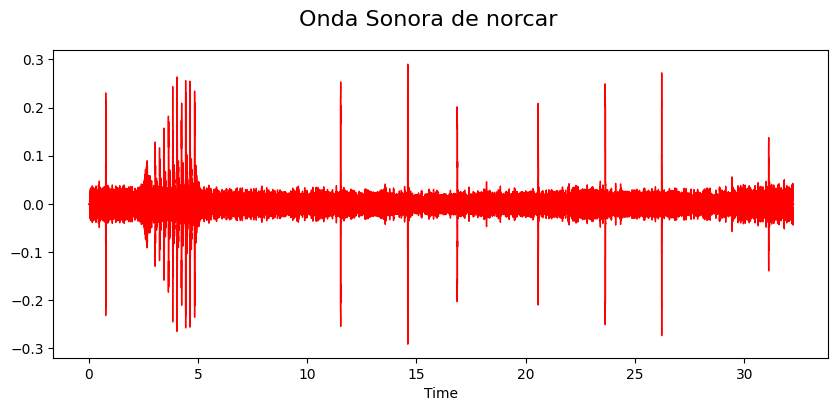

In [52]:
fig, ax = plt.subplots(1, figsize = (10, 4))
fig.suptitle('Onda Sonora de norcar', fontsize=16)
librosa.display.waveshow(y = audio_norcar, sr = sr_norcar, color = "r")

A continuación, se añade rudio Gaussiano al audio, el cual ayuda a simular ruido ambiente en la grabación. Se considera una aplitud de 0.01, para que sea mas evidente el efecto del rudio Gaussiano en el audio, pero lo ideal es encontrar el valor adecuado de amplitud (σ), que permita robustecer el modelo sin afectar su desempeño.

In [49]:
# Añadir ruido blanco
wn = np.random.randn(len(audio_norcar))
data_wn = audio_norcar+ 0.01*wn
ipd.Audio(data_wn, rate=22050)

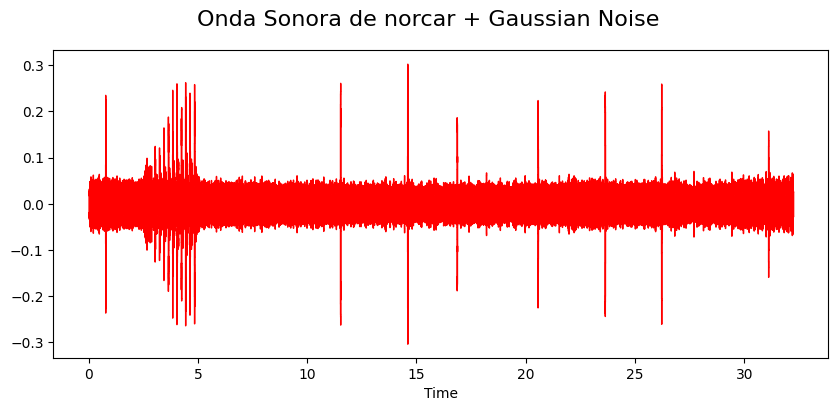

In [54]:
fig, ax = plt.subplots(1, figsize = (10, 4))
fig.suptitle('Onda Sonora de norcar + Gaussian Noise', fontsize=16)
librosa.display.waveshow(y = data_wn, sr = sr_norcar, color = "r")

Se evidencia el cambio en la onda sonora del audio al introducir ruido Gaussiano en la muestra original.

Para el desarrollo del presente trabajo, no fue posible la implementación de técnicas de balanceo, debido a que el conjunto de datos a utilizar, ya son imagenes preprocesadas, y no los audios en sí. 

Debido a que trabajar con la muestra total de datos, la cual está considerablemente desbalanceada, podria dificultar el desarrollo y desempeño de los modelos, se decide escoger un subcojunto del conjunto de datos. Este subconjunto está conformado por las 6 especies con mayor cantidad de datos, las cuales cuentan con 500 muestras de espectrogramas cada una.


#### Selección de métrica

La métrica seleccionada para evaluar los modelos es **Accuracy (Exactitud)**. Se escoge esta métrica debido a que se tiene una proporción igual de datos para cada especie (categoría), y no hay una prioridad en identificar una especie sobre las otras, ya que interesa que el modelo sea capaz de identificar lo mejor posible cada una de las especies, en la misma medida.

#### Implementación de modelo

Las especies que se van a utilizar para entrenar el modelo son: **'brnowl', 'comsan', 'houspa', 'mallar3', 'norcar', 'skylar'**

Previo a la implementación de los modelos, fue necesario convertir las imagenes de los espectogramas para las 6 especies en arreglos matrciales 

In [80]:
from tensorflow.keras.preprocessing import image

especies_list = list(train_csv.groupby('primary_label').filter(lambda x: len(x) >= 480 )['primary_label'].value_counts().index)

def load_images_from_path(path, label):
    images = []
    labels = []

    for file in os.listdir(path):
        images.append(image.img_to_array(image.load_img(os.path.join(path, file), target_size=(224, 224, 3))))
        labels.append((label))
        
    return images, labels

def show_images(images):
    fig, axes = plt.subplots(1, 8, figsize=(20, 20), subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i] / 255)
        
x = []
y = []

En la siguiente figura se pueden visualizar los espectrogramas para las seies especies que se van a clasificar.

In [83]:
NUEVO_DIR = 'C:/Users/kaes1/Desktop/MachineLearningUN/Proyecto/Pruebas'
label = 0
for folder in especies_list:
    images, labels = load_images_from_path(os.path.join(NUEVO_DIR, folder), label)
    show_images(images)
        
    x += images
    y += labels
    label = label + 1

In [82]:
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split

x_trainval, x_test, y_trainval, y_test = train_test_split(x, y, stratify=y, test_size=0.2, random_state=0)
x_train, x_val, y_train, y_val = train_test_split(x_trainval, y_trainval, stratify=y_trainval, test_size=0.2, random_state=0)

x_train_norm = np.array(x_train) / 255
x_val_norm = np.array(x_val) / 255
x_test_norm = np.array(x_test) / 255

y_train_encoded = to_categorical(y_train)
y_val_encoded = to_categorical(y_val)
y_test_encoded = to_categorical(y_test)

ValueError: With n_samples=0, test_size=0.2 and train_size=None, the resulting train set will be empty. Adjust any of the aforementioned parameters.

#### Resultados del modelo

#### Discusión

#### Limitaciones 


Durante el desarrollo del proyecto se encontraron las siguientes limitantes, las cuales dificultaron el avance del mismo:
* Las imagenes de los espectrogramas utilizadas, se encontraban originalmente en formato .TIFF, y este formato no nos permitia ejecutar los modelos inicialmente, por temas de compatibilidad, por lo que se realizó un cambio de formato en las imagenes a .JPEG. No se sabe con certeza si este cambio pudo tener efectos en la estructura de las imagenes, y por consiguiente, en las caracteristicas  que se extraen a través de los modelos.
* Se intentó construir el dataset de espectogramas desde cero, utilizando los audios de **Xeno-canto** y aplicando la transformada de Fourier de 2048, pero los resultados obtenidos con los espectogramas generados no fue muy bueno, y algunas imagenes parecian haber perdido información en el proceso de transformación. 


### Conclusiones